# NEW YORK MOBILITY DATASET

# Data Preparation

### Import Python Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_theme()
import os
import matplotlib.pyplot as plt
%matplotlib notebook
!pip install wordcloud
!pip install -U yellowbrick
!pip install lightgbm
from wordcloud import WordCloud
import math
from scipy import stats
from scipy.stats import f_oneway
from scipy.stats import ttest_ind
from scipy.stats import chisquare
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")
import array
from pylab import rcParams
from sklearn.preprocessing import OneHotEncoder
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.metrics import classification_report
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer

     |████████████████████████████████| 220 kB 1.7 MB/s eta 0:00:01
  Created wheel for wordcloud: filename=wordcloud-1.8.1-cp37-cp37m-macosx_10_9_x86_64.whl size=160361 sha256=17c30ec18e575b54188fc4366fb12c43aa16d2e9c24e1e0f107d64ccdc6741b4
  Stored in directory: /Users/enayat/Library/Caches/pip/wheels/f8/f6/55/6bd394c32a844a621ca0fe5dbf563c8d71d71edaf095656991
Successfully built wordcloud
You should consider upgrading via the '/Users/enayat/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
     |████████████████████████████████| 274 kB 1.9 MB/s eta 0:00:01
  Attempting uninstall: yellowbrick
    Found existing installation: yellowbrick 1.3.post1
    Uninstalling yellowbrick-1.3.post1:
      Successfully uninstalled yellowbrick-1.3.post1
You should consider upgrading via the '/Users/enayat/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
     |████████████████████████████████| 1.2 MB 1.8 MB/s eta 0:00:01
You should consider upgrading via the '/Users/enayat

/Users/enayat/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Show current working directory

In [2]:
import os
os.getcwd ()

'/Users/enayat/Documents/Research/Accepted Papers/ICAPAI_Mobility_NYC/NY Mobility Dataset Analysis_V2'

In [3]:
os.listdir(os.getcwd())

['NYC_Mobility Dataset_Analysis_by TRIPS_Trimmed_Balanced Dataset_SCALE and SMOTEENN_submitted.ipynb',
 'NYC_Mobility Dataset_Analysis_by TRIPS_Clustering_cleaned.ipynb',
 '.ipynb_checkpoints',
 'Citywide_Mobility_Survey_-_Trip_Diary_2018_cleaned.csv',
 'NYC_Mobility Dataset_Analysis_by TRIPS_Trimmed_Balanced Dataset_SCALE and SMOTEENN_cleaned.ipynb',
 'Citywide_Mobility_Survey_-_Trip_Diary_2018_data for clustering.csv']

### Import Data

In [4]:
Trips_NYC = pd.read_csv('Citywide_Mobility_Survey_-_Trip_Diary_2018_cleaned.csv', encoding='utf-8')
Trips_NYC

,Job,Trip_ID,UniqueID,QDAY,qday1typical,qBOROUGH_HOME,NTACODE_HOME,qSURVEYZONE_HOME,qTRIPDAYTIME,qDAY1TRIPSTARTCODE,...,SURVEYZONE_START Latitude,SURVEYZONE_START Longitude,SURVEYZONE_END Latitude,SURVEYZONE_END Longitude,Walk to/from Transit,Day Grouping,Day Grouping & Time,Day&Time,Purpose (Grouped),Within Zone?
0,Online,3100140,100140,Sunday,NaN,Manhattan,NaN,Manhattan Core,NOON,Work,...,40.7549,-73.9840,40.7549,-73.9840,No,Weekend,Weekend NOON,Sunday NOON,"Work, School, Business",Within
1,Online,3103836,103836,Monday,NaN,Staten Island,NaN,Staten Island,AM,Other,...,40.7549,-73.9840,40.7549,-73.9840,No,Weekday,Weekday AM,Monday AM,"Work, School, Business",Within
2,Online,4100749,100749,Wednesday,NaN,Brooklyn,NaN,Inner Brooklyn,PM,Home,...,40.6870,-73.9410,40.6870,-73.9410,No,Weekday,Weekday PM,Wednesday PM,Others,Within
3,Online,1102293,102293,Tuesday,NaN,The Bronx,NaN,Northern Bronx,AM,Work,...,40.8560,-73.8650,40.6870,-73.9410,Yes,Weekday,Weekday AM,Tuesday AM,"Work, School, Business",Outside
4,Phone,52200588,50200588,Thursday,Very typical,Brooklyn,NaN,Outer Brooklyn,PM,School,...,40.7549,-73.9840,40.6960,-73.9950,Yes,Weekday,Weekday PM,Thursday PM,"Work, School, Business",Outside
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7656,Phone,62201178,50201178,Monday,Very typical,Queens,QN53,Middle Queens,PM,"Grocery store or market (including deli, bodeg...",...,40.7000,-73.8000,40.7000,-73.8000,No,Weekday,Weekday PM,Monday PM,Recreation,Within
7657,Phone,62202898,50202898,Thursday,Very typical,The Bronx,NaN,Southern Bronx,PM,Park/Recreational area/Gym,...,40.7059,-74.0513,40.8162,-73.9174,No,Weekday,Weekday PM,Thursday PM,"Work, School, Business",Outside
7658,Phone,63200525,50200525,Wednesday,Somewhat typical,Queens,QN12,Outer Queens,PM,Home,...,40.7650,-73.8050,40.7650,-73.8050,No,Weekday,Weekday PM,Wednesday PM,Recreation,Within
7659,Phone,64200525,50200525,Wednesday,Somewhat typical,Queens,QN12,Outer Queens,PM,Friend or family member's home,...,40.7650,-73.8050,40.7650,-73.8050,No,Weekday,Weekday PM,Wednesday PM,Recreation,Within


### List of Columns/Attributes and No. of Rows and Columns

In [5]:
list(Trips_NYC)

['Job',
 'Trip_ID',
 'UniqueID',
 'QDAY',
 'qday1typical',
 'qBOROUGH_HOME',
 'NTACODE_HOME',
 'qSURVEYZONE_HOME',
 'qTRIPDAYTIME',
 'qDAY1TRIPSTARTCODE',
 'qDAY1TRIPSTARTAM',
 'qDAY1TRIPSTARTNOON',
 'qDAY1TRIPSTARTPM',
 'qDAY1TRIP_OUTSIDENYC_START',
 'qBOROUGH_START',
 'qNTACODE_START',
 'SURVEYZONE_START',
 'qDAY1TRIPEND',
 'qDAY1TRIP_OUTSIDENYC_END',
 'qBOROUGH_END',
 'qNTACODE_END',
 'SURVEYZONE_END',
 'qDAY1TRIPENDCODE',
 'TO TRANSIT: Walk',
 'TO TRANSIT: Bicycle',
 'TO TRANSIT: Car',
 'TO TRANSIT: For-Hire Vehicle',
 'TO TRANSIT: Other',
 "TO TRANSIT: Don't Know",
 'TO TRANSIT: Refused',
 'FROM TRANSIT: Walk',
 'FROM TRANSIT: Bicycle',
 'FROM TRANSIT: Car',
 'FROM TRANSIT: For-Hire Vehicle',
 'FROM TRANSIT: Other',
 "FROM TRANSIT: Don't Know",
 'FROM TRANSIT: Refused',
 'TRIP MODE: Walk',
 'TRIP MODE: Subway',
 'TRIP MODE: Local Bus',
 'TRIP MODE:  Select Bus Service',
 'TRIP MODE:  Express Bus',
 'TRIP MODE:  PATH Train',
 'TRIP MODE: Staten Island Ferry',
 'TRIP MODE: Other Fer

In [6]:
print("Number of rows     :{}".format(Trips_NYC.shape[0]))
print("Number of columns  :{}".format(Trips_NYC.shape[1]))

Number of rows     :7661
Number of columns  :130


### Describe Data and Determine Data Types

In [7]:
Trips_NYC.describe()  

,Trip_ID,UniqueID,qDAY1TRIPLENGTH,qDAY1TRIPLENGTH_FLT,qDAY1TRIPPARKPAY_AMOUNT,qAGE,qTEMPHIGH,qTEMPLOW,qPRECIPITATION,qSUNRISE,qSUNSET,allwt,qSURVEYZONE_HOME_Latitude,qSURVEYZONE_HOME_Longitude,SURVEYZONE_START Latitude,SURVEYZONE_START Longitude,SURVEYZONE_END Latitude,SURVEYZONE_END Longitude
count,7.661000e+03,7.661000e+03,7661.000000,7659.000000,239.000000,7661.000000,6927.000000,6927.000000,6927.000000,6927.000000,6927.000000,7661.000000,7661.000000,7661.000000,7661.000000,7661.000000,7661.000000,7661.000000
mean,2.272617e+07,2.035142e+07,34.409868,32.927928,72.196653,68.470435,75.184062,58.455031,0.126249,5.337589,20.074644,0.993547,40.740043,-73.936253,40.740215,-73.941467,40.740607,-73.944013
std,2.117636e+07,2.107202e+07,121.501015,39.338664,144.461878,313.153682,8.848456,5.257309,0.196237,0.073397,0.202838,0.914823,0.072088,0.092482,0.068680,0.089250,0.069285,0.086200
min,1.100012e+06,1.000120e+05,0.000000,0.000000,1.000000,18.000000,54.000000,51.000000,0.000000,5.240000,19.550000,0.019803,40.579000,-74.151500,40.579000,-74.151500,40.579000,-74.151500
25%,4.104551e+06,1.049050e+05,10.000000,10.000000,5.000000,33.000000,68.000000,55.000000,0.000000,5.280000,20.080000,0.444375,40.696000,-73.984000,40.696000,-73.984000,40.696000,-73.984000
50%,1.220197e+07,1.020162e+07,20.000000,20.000000,20.000000,45.000000,76.000000,56.000000,0.000000,5.330000,20.120000,0.738116,40.754900,-73.941000,40.754900,-73.941000,40.754900,-73.941000
75%,5.120170e+07,5.020059e+07,45.000000,45.000000,69.500000,56.000000,81.000000,61.000000,0.220000,5.370000,20.200000,1.266822,40.797000,-73.865000,40.767000,-73.917400,40.767000,-73.917400
max,6.520052e+07,5.020306e+07,9999.000000,1000.000000,1272.000000,11419.000000,89.000000,72.000000,0.650000,5.510000,20.270000,10.122794,40.856000,-73.800000,40.856000,-73.800000,40.856000,-73.800000


# Data Cleaning

In [8]:
print("Number of rows     :{}".format(Trips_NYC.shape[0]))
print("Number of columns  :{}".format(Trips_NYC.shape[1]))

Number of rows     :7661
Number of columns  :130


In [9]:
Trips_NYC.isnull().any()

Job                    False
Trip_ID                False
UniqueID               False
QDAY                   False
qday1typical            True
                       ...  
Day Grouping           False
Day Grouping & Time    False
Day&Time               False
Purpose (Grouped)      False
Within Zone?           False
Length: 130, dtype: bool

In [10]:
Trips_NYC.drop_duplicates(inplace = True)

In [11]:
Trips_NYC.drop(['TO TRANSIT: Walk', 'TO TRANSIT: Bicycle', 'TO TRANSIT: Car', 'TO TRANSIT: For-Hire Vehicle', 'TO TRANSIT: Other', "TO TRANSIT: Don't Know", 'TO TRANSIT: Refused', 'FROM TRANSIT: Walk', 'FROM TRANSIT: Bicycle', 'FROM TRANSIT: Car', 'FROM TRANSIT: For-Hire Vehicle', 'FROM TRANSIT: Other', "FROM TRANSIT: Don't Know", 'FROM TRANSIT: Refused', 'TRIP MODE: Walk', 'TRIP MODE: Subway', 'TRIP MODE: Local Bus', 'TRIP MODE:  Select Bus Service', 'TRIP MODE:  Express Bus', 'TRIP MODE:  PATH Train', 'TRIP MODE: Staten Island Ferry', 'TRIP MODE: Other Ferry', 'TRIP MODE: Commuter Rail', 'TRIP MODE: Paratransit/ Access-a-Ride', 'TRIP MODE: Personal Car', 'TRIP MODE: Carshare', 'TRIP MODE: Carpool', 'TRIP MODE: Motorcycle', 'TRIP MODE: Yellow Taxi', 'TRIP MODE: Green Taxi', 'TRIP MODE: Ride-Hail Service', 'TRIP MODE: Shared-Ride Service', 'TRIP MODE: Car Servie', 'TRIP MODE: Community/ Dollar Van', 'TRIP MODE: Personal Bicycle', 'TRIP MODE: Citi Bike', 'TRIP MODE: Electric Bicycle', 'TRIP MODE: Other', "TRIP MODE: Don't Know", 'TRIP MODE: Not Coded', 'TRIP MODE: Refused','DISABILITY: Difficulty Hearing', 'DISABILITY: Difficulty Seeing', 'DISABILITY: Difficulty Walking or Climbing Stairs', "DISABILITY: Limited Mobility and Can't Walk", 'DISABILITY: Difficulty Dressing or Bathing', 'DISABILITY: Physical, Mental or Emotional Condition', 'DISABILITY: None of the Above', "DISABILITY: Don't Know", 'DISABILITY: Refused','WELFARE:  I receive public assistance or welfare payments from the state or local welfare office', 'WELFARE: I am a NYCHA tenant or Section 8 housing voucher recipient', 'WELFARE: None of the above', "WELFARE: Don't know", 'WELFARE: Refused','MEMBERSHIP: Zipcar', 'MEMBERSHIP: Car2go', 'MEMBERSHIP: Enterprise', 'MEMBERSHIP: Reach Now', 'MEMBERSHIP: Other',
 'MEMBERSHIP: None of the above', "MEMBERSHIP: Don't know", 'MEMBERSHIP: Refused'], axis=1, inplace=True)

In [12]:
Trips_NYC.drop(['Job', 'NTACODE_HOME', 'qDAY1TRIPSTARTAM', 'qDAY1TRIPSTARTNOON','qDAY1TRIPSTARTPM','qDAY1TRIP_OUTSIDENYC_START','qNTACODE_START','qDAY1TRIP_OUTSIDENYC_END','qNTACODE_END','qDAY1TRIPLENGTH','qDAY1TRIPPARK','qDAY1TRIPPARKPAY','qDAY1TRIPPARKPAY_AMOUNT','qDAY1TRIPBIKESTORE','qHISPANIC','qEDUCATION','qLICENSE','qCARCHANGE','qSMARTPHONE','qTEMPHIGH','qTEMPLOW','qSUNRISE','qSUNSET','qCITIBIKE','qday1typical','qDAY1TRIPSTARTCODE','qDAY1TRIPEND','qDAY1TRIPENDCODE',], axis=1, inplace=True)

In [13]:
list(Trips_NYC)

['Trip_ID',
 'UniqueID',
 'QDAY',
 'qBOROUGH_HOME',
 'qSURVEYZONE_HOME',
 'qTRIPDAYTIME',
 'qBOROUGH_START',
 'SURVEYZONE_START',
 'qBOROUGH_END',
 'SURVEYZONE_END',
 'qDAY1TRIPPURPOSE',
 'qDAY1TRIPLENGTH_FLT',
 'qDAY1TRIPLENGTH_CAT',
 'Number_of_Trips_Taken',
 'qGENDER',
 'qINCOME',
 'qAGE',
 'qAGECODE',
 'qRACE',
 'qRACECODE',
 'qCARACCESS',
 'qPRECIPITATION',
 'qDAY1TRIPTRAVELCODE_SP',
 'qModeGrouping',
 'qSustainableMode',
 'allwt',
 'qPurposeRecode',
 'qSURVEYZONE_HOME_Latitude',
 'qSURVEYZONE_HOME_Longitude',
 'SURVEYZONE_START Latitude',
 'SURVEYZONE_START Longitude',
 'SURVEYZONE_END Latitude',
 'SURVEYZONE_END Longitude',
 'Walk to/from Transit',
 'Day Grouping',
 'Day Grouping & Time',
 'Day&Time',
 'Purpose (Grouped)',
 'Within Zone?']

In [14]:
Trips_NYC.head()

,Trip_ID,UniqueID,QDAY,qBOROUGH_HOME,qSURVEYZONE_HOME,qTRIPDAYTIME,qBOROUGH_START,SURVEYZONE_START,qBOROUGH_END,SURVEYZONE_END,...,SURVEYZONE_START Latitude,SURVEYZONE_START Longitude,SURVEYZONE_END Latitude,SURVEYZONE_END Longitude,Walk to/from Transit,Day Grouping,Day Grouping & Time,Day&Time,Purpose (Grouped),Within Zone?
0,3100140,100140,Sunday,Manhattan,Manhattan Core,NOON,Manhattan,Manhattan Core,Manhattan,Manhattan Core,...,40.7549,-73.984,40.7549,-73.984,No,Weekend,Weekend NOON,Sunday NOON,"Work, School, Business",Within
1,3103836,103836,Monday,Staten Island,Staten Island,AM,Manhattan,Manhattan Core,Manhattan,Manhattan Core,...,40.7549,-73.984,40.7549,-73.984,No,Weekday,Weekday AM,Monday AM,"Work, School, Business",Within
2,4100749,100749,Wednesday,Brooklyn,Inner Brooklyn,PM,Brooklyn,Inner Brooklyn,Brooklyn,Inner Brooklyn,...,40.6870,-73.941,40.6870,-73.941,No,Weekday,Weekday PM,Wednesday PM,Others,Within
3,1102293,102293,Tuesday,The Bronx,Northern Bronx,AM,The Bronx,Northern Bronx,Brooklyn,Inner Brooklyn,...,40.8560,-73.865,40.6870,-73.941,Yes,Weekday,Weekday AM,Tuesday AM,"Work, School, Business",Outside
4,52200588,50200588,Thursday,Brooklyn,Outer Brooklyn,PM,Manhattan,Manhattan Core,Brooklyn,Outer Brooklyn,...,40.7549,-73.984,40.6960,-73.995,Yes,Weekday,Weekday PM,Thursday PM,"Work, School, Business",Outside


In [15]:
Trips_NYC.describe() 

,Trip_ID,UniqueID,qDAY1TRIPLENGTH_FLT,qAGE,qPRECIPITATION,allwt,qSURVEYZONE_HOME_Latitude,qSURVEYZONE_HOME_Longitude,SURVEYZONE_START Latitude,SURVEYZONE_START Longitude,SURVEYZONE_END Latitude,SURVEYZONE_END Longitude
count,7.661000e+03,7.661000e+03,7659.000000,7661.000000,6927.000000,7661.000000,7661.000000,7661.000000,7661.000000,7661.000000,7661.000000,7661.000000
mean,2.272617e+07,2.035142e+07,32.927928,68.470435,0.126249,0.993547,40.740043,-73.936253,40.740215,-73.941467,40.740607,-73.944013
std,2.117636e+07,2.107202e+07,39.338664,313.153682,0.196237,0.914823,0.072088,0.092482,0.068680,0.089250,0.069285,0.086200
min,1.100012e+06,1.000120e+05,0.000000,18.000000,0.000000,0.019803,40.579000,-74.151500,40.579000,-74.151500,40.579000,-74.151500
25%,4.104551e+06,1.049050e+05,10.000000,33.000000,0.000000,0.444375,40.696000,-73.984000,40.696000,-73.984000,40.696000,-73.984000
50%,1.220197e+07,1.020162e+07,20.000000,45.000000,0.000000,0.738116,40.754900,-73.941000,40.754900,-73.941000,40.754900,-73.941000
75%,5.120170e+07,5.020059e+07,45.000000,56.000000,0.220000,1.266822,40.797000,-73.865000,40.767000,-73.917400,40.767000,-73.917400
max,6.520052e+07,5.020306e+07,1000.000000,11419.000000,0.650000,10.122794,40.856000,-73.800000,40.856000,-73.800000,40.856000,-73.800000


In [16]:
Trips_NYC.isna().sum()

Trip_ID                         0
UniqueID                        0
QDAY                            0
qBOROUGH_HOME                   0
qSURVEYZONE_HOME                0
qTRIPDAYTIME                    0
qBOROUGH_START                  0
SURVEYZONE_START                0
qBOROUGH_END                    0
SURVEYZONE_END                  0
qDAY1TRIPPURPOSE                0
qDAY1TRIPLENGTH_FLT             2
qDAY1TRIPLENGTH_CAT             0
Number_of_Trips_Taken           7
qGENDER                         0
qINCOME                       125
qAGE                            0
qAGECODE                        0
qRACE                          38
qRACECODE                       0
qCARACCESS                     16
qPRECIPITATION                734
qDAY1TRIPTRAVELCODE_SP          0
qModeGrouping                   0
qSustainableMode                0
allwt                           0
qPurposeRecode                  0
qSURVEYZONE_HOME_Latitude       0
qSURVEYZONE_HOME_Longitude      0
SURVEYZONE_STA

In [17]:
Trips_NYC['qINCOME'] = Trips_NYC['qINCOME'].replace({np.nan: "Less than $14,999"})
Trips_NYC['qINCOME'] = Trips_NYC['qINCOME'].replace({"Refused": "Less than $14,999"})

In [18]:
Trips_NYC['qPRECIPITATION'] = Trips_NYC['qPRECIPITATION'].replace({np.nan: 0})
Trips_NYC['qPRECIPITATION'] = Trips_NYC['qPRECIPITATION'].apply(lambda x: "Rain" if x > 0 else "No Rain")

In [19]:
Trips_NYC['qModeGrouping'] = Trips_NYC['qModeGrouping'].replace({"na":'Walk'})

In [20]:
Trips_NYC['qGENDER'] = Trips_NYC['qGENDER'].replace({"Refused":'Female'})

In [21]:
Trips_NYC['qCARACCESS'] = Trips_NYC['qCARACCESS'].replace({"I personally own or lease a car":"own car"})
Trips_NYC['qCARACCESS'] = Trips_NYC['qCARACCESS'].replace({"I do not have access to a car":"NO car"})
Trips_NYC['qCARACCESS'] = Trips_NYC['qCARACCESS'].replace({"I do not personally own or lease a car, but I have access to a car belonging to a member of my household":"NO car"})
Trips_NYC['qCARACCESS'] = Trips_NYC['qCARACCESS'].replace({"NA":"NO car"})
Trips_NYC['qCARACCESS'] = Trips_NYC['qCARACCESS'].replace({"Other":"NO car"})
Trips_NYC['qCARACCESS'] = Trips_NYC['qCARACCESS'].replace({"Refused":"NO car"})

In [22]:
Trips_NYC['qRACECODE'] = Trips_NYC['qRACECODE'].replace({"Don't know, Non-Hispanic":"Other, Non-Hispanic"})

In [23]:
Trips_NYC.dropna(inplace = True)

In [24]:
Trips_NYC.isnull().any()

Trip_ID                       False
UniqueID                      False
QDAY                          False
qBOROUGH_HOME                 False
qSURVEYZONE_HOME              False
qTRIPDAYTIME                  False
qBOROUGH_START                False
SURVEYZONE_START              False
qBOROUGH_END                  False
SURVEYZONE_END                False
qDAY1TRIPPURPOSE              False
qDAY1TRIPLENGTH_FLT           False
qDAY1TRIPLENGTH_CAT           False
Number_of_Trips_Taken         False
qGENDER                       False
qINCOME                       False
qAGE                          False
qAGECODE                      False
qRACE                         False
qRACECODE                     False
qCARACCESS                    False
qPRECIPITATION                False
qDAY1TRIPTRAVELCODE_SP        False
qModeGrouping                 False
qSustainableMode              False
allwt                         False
qPurposeRecode                False
qSURVEYZONE_HOME_Latitude   

In [25]:
print("Number of rows     :{}".format(Trips_NYC.shape[0]))
print("Number of columns  :{}".format(Trips_NYC.shape[1]))

Number of rows     :7598
Number of columns  :39


# Data Analysis: Trip Details

## Additional Pre-processing Steps

In [26]:
Trips_NYC_Analysis_byTrips = Trips_NYC

In [27]:
list(Trips_NYC_Analysis_byTrips)

['Trip_ID',
 'UniqueID',
 'QDAY',
 'qBOROUGH_HOME',
 'qSURVEYZONE_HOME',
 'qTRIPDAYTIME',
 'qBOROUGH_START',
 'SURVEYZONE_START',
 'qBOROUGH_END',
 'SURVEYZONE_END',
 'qDAY1TRIPPURPOSE',
 'qDAY1TRIPLENGTH_FLT',
 'qDAY1TRIPLENGTH_CAT',
 'Number_of_Trips_Taken',
 'qGENDER',
 'qINCOME',
 'qAGE',
 'qAGECODE',
 'qRACE',
 'qRACECODE',
 'qCARACCESS',
 'qPRECIPITATION',
 'qDAY1TRIPTRAVELCODE_SP',
 'qModeGrouping',
 'qSustainableMode',
 'allwt',
 'qPurposeRecode',
 'qSURVEYZONE_HOME_Latitude',
 'qSURVEYZONE_HOME_Longitude',
 'SURVEYZONE_START Latitude',
 'SURVEYZONE_START Longitude',
 'SURVEYZONE_END Latitude',
 'SURVEYZONE_END Longitude',
 'Walk to/from Transit',
 'Day Grouping',
 'Day Grouping & Time',
 'Day&Time',
 'Purpose (Grouped)',
 'Within Zone?']

In [28]:
# removed redundant fields in the dataset
Trips_NYC_Analysis_byTrips = Trips_NYC_Analysis_byTrips.drop(labels= ['Trip_ID', 'UniqueID','qBOROUGH_HOME','qSURVEYZONE_HOME','qDAY1TRIPPURPOSE','qDAY1TRIPLENGTH_FLT','qAGE','qRACE','qDAY1TRIPTRAVELCODE_SP','allwt','qSURVEYZONE_HOME_Latitude','qSURVEYZONE_HOME_Longitude','SURVEYZONE_START Latitude','SURVEYZONE_START Longitude','SURVEYZONE_END Latitude','SURVEYZONE_END Longitude'], axis=1)

In [29]:
list(Trips_NYC_Analysis_byTrips)

['QDAY',
 'qTRIPDAYTIME',
 'qBOROUGH_START',
 'SURVEYZONE_START',
 'qBOROUGH_END',
 'SURVEYZONE_END',
 'qDAY1TRIPLENGTH_CAT',
 'Number_of_Trips_Taken',
 'qGENDER',
 'qINCOME',
 'qAGECODE',
 'qRACECODE',
 'qCARACCESS',
 'qPRECIPITATION',
 'qModeGrouping',
 'qSustainableMode',
 'qPurposeRecode',
 'Walk to/from Transit',
 'Day Grouping',
 'Day Grouping & Time',
 'Day&Time',
 'Purpose (Grouped)',
 'Within Zone?']

In [32]:
A_TRIPS = Trips_NYC_Analysis_byTrips.columns[(Trips_NYC_Analysis_byTrips.dtypes =='object').values].tolist()
A_TRIPS

['QDAY',
 'qTRIPDAYTIME',
 'qBOROUGH_START',
 'SURVEYZONE_START',
 'qBOROUGH_END',
 'SURVEYZONE_END',
 'qDAY1TRIPLENGTH_CAT',
 'Number_of_Trips_Taken',
 'qGENDER',
 'qINCOME',
 'qAGECODE',
 'qRACECODE',
 'qCARACCESS',
 'qPRECIPITATION',
 'qModeGrouping',
 'qSustainableMode',
 'qPurposeRecode',
 'Walk to/from Transit',
 'Day Grouping',
 'Day Grouping & Time',
 'Day&Time',
 'Purpose (Grouped)',
 'Within Zone?']

In [33]:
# For these categorical columns, LabelEnconder was used to convert them to numerical datatype
from sklearn.preprocessing import LabelEncoder

for col in A_TRIPS:
        globals()['LE_{}'.format(col)] = LabelEncoder()
        Trips_NYC_Analysis_byTrips[col] = globals()['LE_{}'.format(col)].fit_transform(Trips_NYC_Analysis_byTrips[col])
Trips_NYC_Analysis_byTrips.head() 

,QDAY,qTRIPDAYTIME,qBOROUGH_START,SURVEYZONE_START,qBOROUGH_END,SURVEYZONE_END,qDAY1TRIPLENGTH_CAT,Number_of_Trips_Taken,qGENDER,qINCOME,...,qPRECIPITATION,qModeGrouping,qSustainableMode,qPurposeRecode,Walk to/from Transit,Day Grouping,Day Grouping & Time,Day&Time,Purpose (Grouped),Within Zone?
0,3,1,1,2,1,2,5,7,1,0,...,0,0,1,2,0,1,4,10,4,1
1,1,0,1,2,1,2,6,9,0,5,...,0,0,1,2,0,0,0,3,4,1
2,6,2,0,0,0,0,12,9,0,0,...,1,0,1,5,0,0,2,20,1,1
3,5,0,5,4,0,0,13,7,0,6,...,0,7,1,2,1,0,0,15,4,0
4,4,2,1,2,0,6,8,6,0,8,...,0,7,1,7,1,0,2,14,4,0


In [34]:
# Listing the category labels of the converted numerical values
for col in A_TRIPS:
    print(col , "  : ", globals()['LE_{}'.format(col)].classes_)

QDAY   :  ['Friday' 'Monday' 'Saturday' 'Sunday' 'Thursday' 'Tuesday' 'Wednesday']
qTRIPDAYTIME   :  ['AM' 'NOON' 'PM']
qBOROUGH_START   :  ['Brooklyn' 'Manhattan' 'Outside of NYC' 'Queens' 'Staten Island'
 'The Bronx']
SURVEYZONE_START   :  ['Inner Brooklyn' 'Inner Queens' 'Manhattan Core' 'Middle Queens'
 'Northern Bronx' 'Northern Manhattan' 'Outer Brooklyn' 'Outer Queens'
 'Outside of NYC' 'Southern Bronx' 'Staten Island']
qBOROUGH_END   :  ['Brooklyn' 'Manhattan' 'Outside of NYC' 'Queens' 'Staten Island'
 'The Bronx']
SURVEYZONE_END   :  ['Inner Brooklyn' 'Inner Queens' 'Manhattan Core' 'Middle Queens'
 'Northern Bronx' 'Northern Manhattan' 'Outer Brooklyn' 'Outer Queens'
 'Outside of NYC' 'Southern Bronx' 'Staten Island']
qDAY1TRIPLENGTH_CAT   :  ['0 to 5' '11 to 15' '16 to 20' '180+' '21 to 25' '26 to 30' '31 to 35'
 '36 to 40' '41 to 45' '46 to 50' '51 to 55' '56 to 60' '6 to 10'
 '61 to 180']
Number_of_Trips_Taken   :  ['1 trip' '10 trips' '11 trips' '12 trips' '15 trips' '19 

### Correlations visualized through Heatmap

<IPython.core.display.Javascript object>


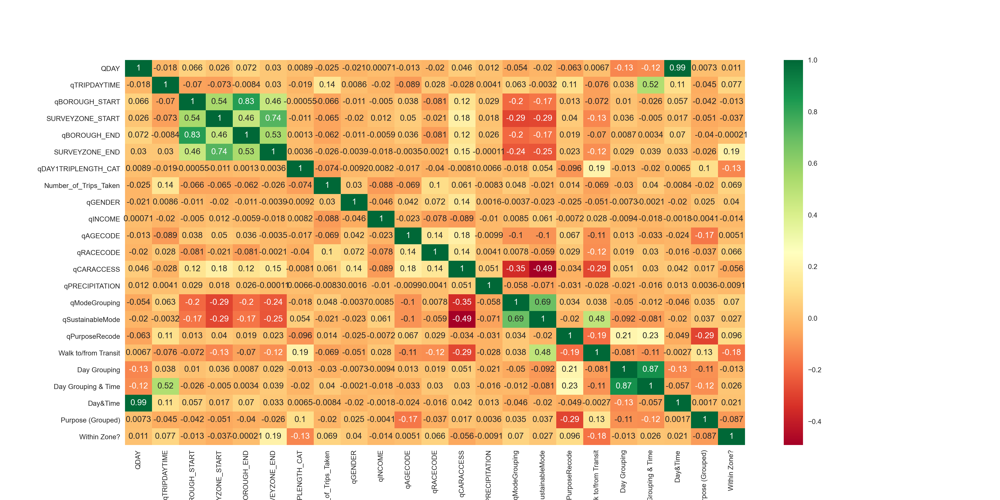

In [35]:
corrmat = Trips_NYC_Analysis_byTrips.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,10))

g=sns.heatmap(Trips_NYC_Analysis_byTrips[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [36]:
cor_target = abs(corrmat["qPurposeRecode"])
relevant_features = cor_target[cor_target>0.2]
relevant_features

qPurposeRecode         1.000000
Day Grouping           0.206217
Day Grouping & Time    0.230475
Purpose (Grouped)      0.287581
Name: qPurposeRecode, dtype: float64

In [37]:
cor_target = abs(corrmat["qModeGrouping"])
relevant_features = cor_target[cor_target>0.2]
relevant_features

qBOROUGH_START      0.201426
SURVEYZONE_START    0.290482
qBOROUGH_END        0.204566
SURVEYZONE_END      0.241869
qCARACCESS          0.353321
qModeGrouping       1.000000
qSustainableMode    0.690297
Name: qModeGrouping, dtype: float64

In [38]:
cor_target = abs(corrmat["qSustainableMode"])
relevant_features = cor_target[cor_target>0.2]
relevant_features

SURVEYZONE_START        0.285181
SURVEYZONE_END          0.252265
qCARACCESS              0.491377
qModeGrouping           0.690297
qSustainableMode        1.000000
Walk to/from Transit    0.481511
Name: qSustainableMode, dtype: float64

In [39]:
# from the Correlation Analysis (through heatmap visualization), qBOROUGH_START and qBOROUGH_END are highly correlated to SURVEYZONE_START and SURVEYZONE_END, respectively. Thus, only one set of this information is retained
# Sustainable Mode of Transportation (target variable) is determined by ModeGrouping transportation classification 
Trips_NYC_Analysis_byTrips = Trips_NYC_Analysis_byTrips.drop(labels= ['qBOROUGH_START','qBOROUGH_END','qModeGrouping'], axis=1)

In [40]:
len(Trips_NYC_Analysis_byTrips) - len(Trips_NYC_Analysis_byTrips.drop_duplicates())

469

In [41]:
Trips_NYC_Analysis_byTrips = Trips_NYC_Analysis_byTrips.drop_duplicates()
Trips_NYC_Analysis_byTrips.reset_index(drop=True ,inplace=True)

## Feature Selection Methods

In [42]:
X = Trips_NYC_Analysis_byTrips.drop(['qSustainableMode'],axis=1)
y = Trips_NYC_Analysis_byTrips['qSustainableMode'].values
feature_name = X.columns.tolist() 

### 1.A. Filter Method - Pearson Correlation

In [43]:
def cor_selector(X, y):
    cor_list = []
    # calculate the correlation with y for each feature
    for i in X.columns.tolist():
        cor = np.corrcoef(X[i], y)[0, 1]
        cor_list.append(cor)
    # replace NaN with 0
    cor_list = [0 if np.isnan(i) else i for i in cor_list]
    # feature name
    cor_feature = X.iloc[:,np.argsort(np.abs(cor_list))[-15:]].columns.tolist()
    # feature selection? 0 for not select, 1 for select
    cor_support = [True if i in cor_feature else False for i in feature_name]
    return cor_support, cor_feature

In [44]:
cor_support, cor_feature = cor_selector(X, y)
print(str(len(cor_feature)), 'selected features')

15 selected features


### 1.B. Filter Method - Chi2

In [45]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler
X_norm = MinMaxScaler().fit_transform(X)
chi_selector = SelectKBest(chi2, k=15)
chi_selector.fit(X_norm, y)

SelectKBest(k=15, score_func=<function chi2 at 0x7fc8f861f5f0>)

In [46]:
chi_support = chi_selector.get_support()
chi_feature = X.loc[:,chi_support].columns.tolist()
print(str(len(chi_feature)), 'selected features')

15 selected features


### 2. Wrapper Method

In [47]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
rfe_selector = RFE(estimator=LogisticRegression(), n_features_to_select=15, step=1, verbose=1)
rfe_selector.fit(X_norm, y)

Fitting estimator with 19 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.


RFE(estimator=LogisticRegression(), n_features_to_select=15, verbose=1)

In [48]:
rfe_support = rfe_selector.get_support()
rfe_feature = X.loc[:,rfe_support].columns.tolist()
print(str(len(rfe_feature)), 'selected features')

15 selected features


### 3. Embedded Method

In [53]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression

embeded_lr_selector = SelectFromModel(LogisticRegression(penalty="l2"), threshold="median")
embeded_lr_selector.fit(X_norm, y)

SelectFromModel(estimator=LogisticRegression(), threshold='median')

In [54]:
embeded_lr_support = embeded_lr_selector.get_support()
embeded_lr_feature = X.loc[:,embeded_lr_support].columns.tolist()
print(str(len(embeded_lr_feature)), 'selected features')

10 selected features


### Results of each Feature Selection Methods

In [56]:
pd.set_option('display.max_rows', None)
# put all selection together
feature_selection_df = pd.DataFrame({'Feature':feature_name, 'Pearson':cor_support, 'Chi-2':chi_support, 'RFE':rfe_support, 'Logistics':embeded_lr_support})
# count the selected times for each feature
feature_selection_df['Total'] = np.sum(feature_selection_df, axis=1)
# display the top 15
feature_selection_df = feature_selection_df.sort_values(['Total','Feature'] , ascending=False)
feature_selection_df.index = range(1, len(feature_selection_df)+1)
feature_selection_df.head(15)

,Feature,Pearson,Chi-2,RFE,Logistics,Total
1,qRACECODE,True,True,True,True,4
2,qINCOME,True,True,True,True,4
3,qGENDER,True,True,True,True,4
4,qCARACCESS,True,True,True,True,4
5,Within Zone?,True,True,True,True,4
6,Walk to/from Transit,True,True,True,True,4
7,SURVEYZONE_START,True,True,True,True,4
8,SURVEYZONE_END,True,True,True,True,4
9,Day Grouping,True,True,True,True,4
10,qPurposeRecode,False,True,True,True,3


In [57]:
# Only those 3 out of 4 "True's" (i.e tagged as relevant features) are included further in the modeling and evaluation steps
Trips_NYC_Analysis_byTrips.drop(['QDAY', 'qTRIPDAYTIME','Number_of_Trips_Taken', 'Day&Time', 'Purpose (Grouped)'], axis=1, inplace=True)

In [58]:
list(Trips_NYC_Analysis_byTrips)

['SURVEYZONE_START',
 'SURVEYZONE_END',
 'qDAY1TRIPLENGTH_CAT',
 'qGENDER',
 'qINCOME',
 'qAGECODE',
 'qRACECODE',
 'qCARACCESS',
 'qPRECIPITATION',
 'qSustainableMode',
 'qPurposeRecode',
 'Walk to/from Transit',
 'Day Grouping',
 'Day Grouping & Time',
 'Within Zone?']

# Visualizing and Understanding the Correlation between Independent Variables and Target Variables

In [59]:
Trips_NYC_Analysis_byTrips

,SURVEYZONE_START,SURVEYZONE_END,qDAY1TRIPLENGTH_CAT,qGENDER,qINCOME,qAGECODE,qRACECODE,qCARACCESS,qPRECIPITATION,qSustainableMode,qPurposeRecode,Walk to/from Transit,Day Grouping,Day Grouping & Time,Within Zone?
0,2,2,5,1,0,3,4,1,0,1,2,0,1,4,1
1,2,2,6,0,5,1,4,0,0,1,2,0,0,0,1
2,0,0,12,0,0,2,1,1,1,1,5,0,0,2,1
3,4,0,13,0,6,4,2,0,0,1,2,1,0,0,0
4,2,6,8,0,8,0,3,0,0,1,7,1,0,2,0
5,5,5,1,0,5,5,2,1,1,1,5,0,0,1,1
6,9,9,11,1,8,1,2,0,0,0,7,0,0,1,1
7,1,1,1,1,0,1,0,0,1,1,8,1,0,0,1
8,5,5,2,1,5,1,4,0,1,1,9,0,1,4,1
9,2,2,5,0,6,3,4,0,0,1,5,0,0,1,1


<IPython.core.display.Javascript object>


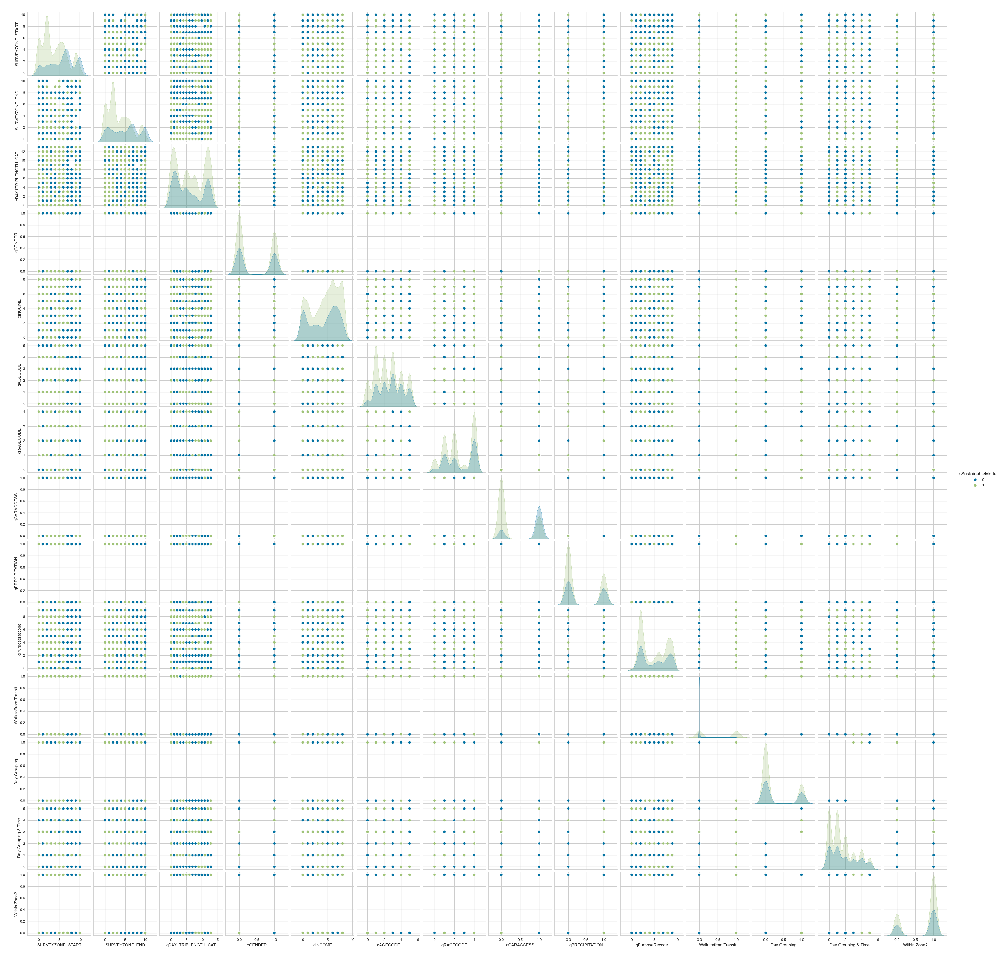

In [53]:
sns.pairplot(Trips_NYC_Analysis_byTrips, hue ='qSustainableMode')

In [60]:
# Removed other features not showing relevant correlation to target variable or are redundant
Trips_NYC_Analysis_byTrips.drop(['Within Zone?', 'Walk to/from Transit', 'Day Grouping & Time', 'qPRECIPITATION', 'qAGECODE', 'qDAY1TRIPLENGTH_CAT'], axis=1, inplace=True)

# Modeling and Evaluation

In [61]:
Trips_NYC_Analysis_byTrips

,SURVEYZONE_START,SURVEYZONE_END,qGENDER,qINCOME,qRACECODE,qCARACCESS,qSustainableMode,qPurposeRecode,Day Grouping
0,2,2,1,0,4,1,1,2,1
1,2,2,0,5,4,0,1,2,0
2,0,0,0,0,1,1,1,5,0
3,4,0,0,6,2,0,1,2,0
4,2,6,0,8,3,0,1,7,0
5,5,5,0,5,2,1,1,5,0
6,9,9,1,8,2,0,0,7,0
7,1,1,1,0,0,0,1,8,0
8,5,5,1,5,4,0,1,9,1
9,2,2,0,6,4,0,1,5,0


In [62]:
X = Trips_NYC_Analysis_byTrips.drop(['qSustainableMode'],axis=1)
y = Trips_NYC_Analysis_byTrips['qSustainableMode'].values

In [63]:
len(y)

7129

In [64]:
Trips_NYC_Analysis_byTrips['qSustainableMode'].value_counts(normalize=True)*100

1    65.647356
0    34.352644
Name: qSustainableMode, dtype: float64

<IPython.core.display.Javascript object>


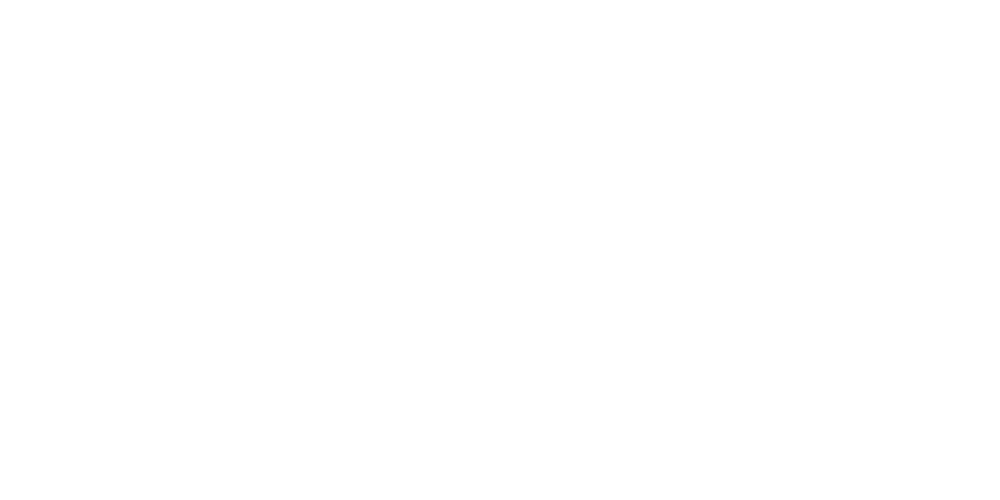

<AxesSubplot:ylabel='qSustainableMode'>

In [65]:
plt.figure(figsize=(10,5))
Trips_NYC_Analysis_byTrips['qSustainableMode'].value_counts().plot(kind='pie',  autopct='%1.0f%%', startangle=360, fontsize=13)

In [66]:
# Setting the data into 80-20 train-test split
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test= train_test_split(X, y, test_size=0.2,random_state = 42)

In [67]:
# Before SMOTE
print("Before SMOTE_Train, counts of label '1': {}".format(sum(y_train==1)))
print("Before SMOTE_Train, counts of label '0': {} \n".format(sum(y_train==0)))

print("Before SMOTE_Test, counts of label '1': {}".format(sum(y_test==1)))
print("Before SMOTE_Test, counts of label '0': {} \n".format(sum(y_test==0)))

Before SMOTE_Train, counts of label '1': 3732
Before SMOTE_Train, counts of label '0': 1971 

Before SMOTE_Test, counts of label '1': 948
Before SMOTE_Test, counts of label '0': 478 



### Balance the Dataset : Scale Features and Add Samples to Minority Class using SMOTEENN

In [68]:
# Scaling the data using MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
MMS = MinMaxScaler()
x_train_scaled = pd.DataFrame(MMS.fit_transform(x_train), columns=x_train.columns)
x_test_scaled = pd.DataFrame(MMS.transform(x_test), columns=x_test.columns)

In [69]:
# Adding samples to minority class using SMOTE
from imblearn.combine import SMOTEENN
smenn = SMOTEENN()

x_train_sm, y_train_sm = smenn.fit_resample(x_train_scaled, y_train)
x_test_sm, y_test_sm = smenn.fit_resample(x_test_scaled, y_test)

In [70]:
# After SMOTE
print("After SMOTE_Train, counts of label '1': {}".format(sum(y_train_sm==1)))
print("After SMOTE_Train, counts of label '0': {} \n".format(sum(y_train_sm==0)))

print("After SMOTE_Test, counts of label '1': {}".format(sum(y_test_sm==1)))
print("After SMOTE_Test, counts of label '0': {} \n".format(sum(y_test_sm==0)))

After SMOTE_Train, counts of label '1': 2232
After SMOTE_Train, counts of label '0': 2419 

After SMOTE_Test, counts of label '1': 521
After SMOTE_Test, counts of label '0': 586 



# Modeling and Evaluation after balancing

In [71]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    
    
def classif_results(): 
  
  
  conf_mat = confusion_matrix(y_true=y_test_sm, y_pred=pred_y_after_balancing)
  print('Confusion matrix:\n', conf_mat)
  
  labels = ['Class 0', 'Class 1']
  fig = plt.figure()
  ax = fig.add_subplot(111)
  cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
  fig.colorbar(cax)
  ax.set_xticklabels([''] + labels)
  ax.set_yticklabels([''] + labels)
  plt.xlabel('Predicted')
  plt.ylabel('Expected')
  

  print("Accuracy", metrics.accuracy_score(y_test_sm, pred_y_after_balancing))

  from sklearn.metrics import classification_report
  print(classification_report(y_test_sm, pred_y_after_balancing))

  
  auc = roc_auc_score(y_test_sm, pred_y_after_balancing)
  print("AUC Score: ")
  print(auc)

    
  fpr, tpr, thresholds = roc_curve(y_test_sm, pred_y_after_balancing)
  plt.figure(figsize=(10,6))
  plot_roc_curve(fpr, tpr)

## Naive Bayes

In [137]:
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import confusion_matrix

NB = GaussianNB()
NB.fit(x_train_sm, y_train_sm)

pred_y_after_balancing = classifier_after_balancing.predict(x_test_sm)
cm = confusion_matrix(y_test_sm,pred_y_after_balancing)
# classif_results()

## Decision Tree

In [138]:
DT = tree.DecisionTreeClassifier()
DT.fit(x_train_sm, y_train_sm)

# pred_y_after_balancing = classifier_after_balancing.predict(x_test_sm)
# cm = confusion_matrix(y_test_sm,pred_y_after_balancing)

# classif_results()

DecisionTreeClassifier()

## Logistic Regression

In [139]:
from sklearn.linear_model import LogisticRegression 
LR = LogisticRegression()
LR.fit(x_train_sm, y_train_sm)

# pred_y_after_balancing = log_model_after_balancing.predict(x_test_sm)
# cm = confusion_matrix(y_test_sm,pred_y_after_balancing)
# classif_results()

LogisticRegression()

## kNN

In [140]:
KNN = KNeighborsClassifier()
KNN.fit(x_train_sm, y_train_sm)

# pred_y_after_balancing = classifier_after_balancing.predict(x_test_sm)
# cm = confusion_matrix(y_test_sm,pred_y_after_balancing)
# classif_results()

KNeighborsClassifier()

## Support Vector Machines

In [142]:
from sklearn import svm
svm = svm.SVC(gamma='scale')
svm.fit(x_train_sm, y_train_sm)

# pred_y_after_balancing = classifier_after_balancing.predict(x_test_sm)
# cm = confusion_matrix(y_test_sm,pred_y_after_balancing)
# # classif_results()

SVC()

## Artificial Neural Network - Multilayer Perceptron (MLP)

In [147]:
from sklearn.neural_network import MLPClassifier
# snn = MLPClassifier(solver='lbfgs', alpha=1e-2, hidden_layer_sizes=(8, 8), random_state=42)
mlp = MLPClassifier(hidden_layer_sizes=(150,100,50), max_iter=100,  alpha=1e-2, activation = 'relu',
                    solver='adam',random_state=1)
mlp.fit(x_train_sm, y_train_sm)

# pred_y_after_balancing = classifier_after_balancing.predict(x_test_sm)
# cm = confusion_matrix(y_test_sm,pred_y_after_balancing)

# classif_results()

MLPClassifier(alpha=0.01, hidden_layer_sizes=(150, 100, 50), max_iter=100,
              random_state=1)

<IPython.core.display.Javascript object>


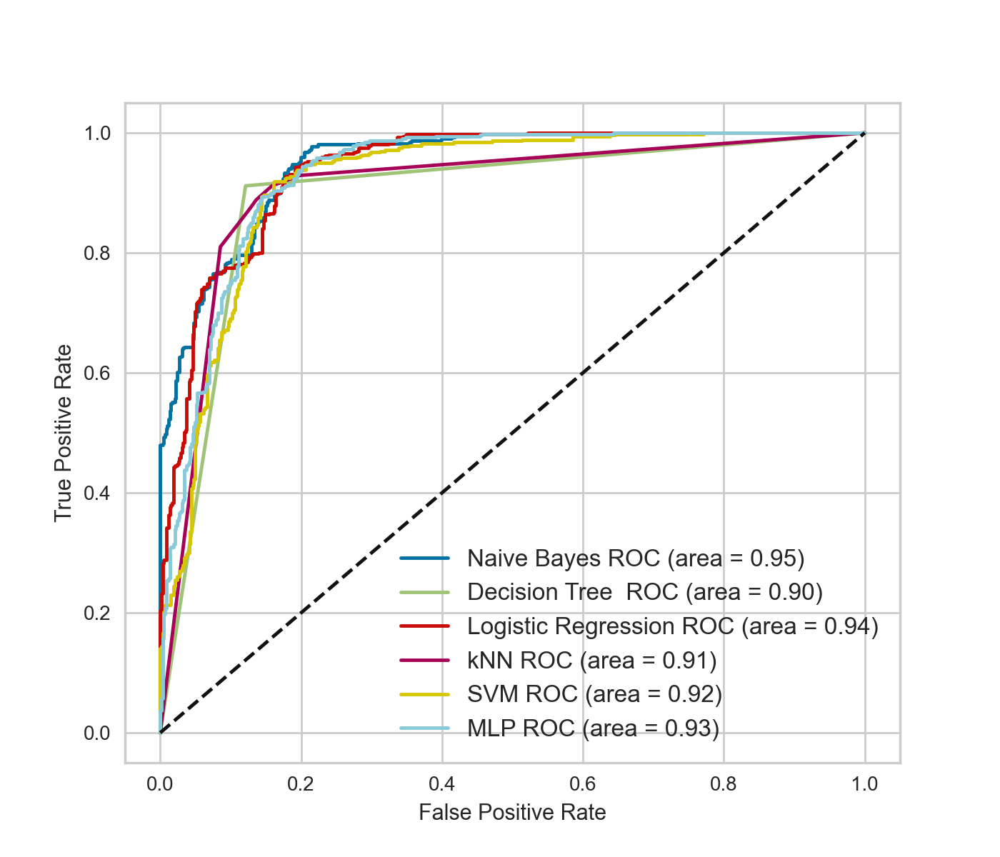

In [148]:
models = [
  
    {
          'label': 'Naive Bayes',
        'model': NB
    },
    {
        'label': 'Decision Tree ',
        'model': DT
    },
    {
        'label': 'Logistic Regression',
        'model': LR
    },
    {
        'label': 'kNN',
        'model': KNN
    },
     {
        'label': 'SVM',
        'model': svm
    },
     {
        'label': 'MLP',
        'model': mlp
    }
]
    
from sklearn.metrics import roc_curve, roc_auc_score, auc


plt.clf()
plt.figure(figsize=(7,6))
for m in models:
    m['model'].probability = True
    probas = m['model'].fit(x_train_sm,y_train_sm).predict_proba(x_test_sm)
    fpr, tpr, thresholds = roc_curve(y_test_sm, probas[:, 1])
    roc_auc  = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc=0, fontsize='medium')
plt.show()

# Predicting if a certain trip is through Sustainable or Non Sustainable Mood of Transportation 
 
 qGENDER   :  0: 'Female', 1:'Male'
 
 qINCOME   :  0: '$100,000 - $149,999', 1: '$15,000 - $24,999', 2: '$150,000-$199,999', 3: '$200,000 and above', 4: '$25,000 - $34,999', 5: '$35,000 - $49,999', 6: '$50,000 - $74,999', 7: '$75,000 - $99,999', 8: 'Less than $14,999'

 qRACECODE   :   0: 'Asian, Non-Hispanic', 1: 'Black, Non-Hispanic', 2: 'Hispanic', 3: 'Other, Non-Hispanic', 4: 'White, Non-Hispanic
 
 qCARACCESS   :  0: 'NO car', 1: 'own car'
 
 SURVEYZONE_START   :  0: 'Inner Brooklyn', 1: 'Inner Queens', 2: 'Manhattan Core', 3: 'Middle Queens', 4: 'Northern Bronx', 5: 'Northern Manhattan', 6: 'Outer Brooklyn', 7: 'Outer Queens', 8:  'Outside of NYC', 9: 'Southern Bronx', 10: 'Staten Island'

 SURVEYZONE_END   :  0: 'Inner Brooklyn', 1: 'Inner Queens', 2: 'Manhattan Core', 3: 'Middle Queens', 4: 'Northern Bronx', 5: 'Northern Manhattan', 6: 'Outer Brooklyn', 7: 'Outer Queens', 8:  'Outside of NYC', 9: 'Southern Bronx', 10: 'Staten Island'
 
 qPurposeRecode   :  0: 'Accompanying other traveler', 1: 'Business', 2: 'Commute to/from work', 3: 'Dining', 4: "Medical visit (doctor's office)", 5: 'Other', 6: 'Personal errands', 7: 'School', 8: 'Shopping', 9: 'Social/recreation' 
 
 Day Grouping   :  0: 'Weekday' 1: 'Weekend'
 
 
 qSustainableMode   :  0: 'No', 1: 'Yes'